<a href="https://colab.research.google.com/github/KauaHenSilva/python_social_distance_alert/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

## Pacotes externos

In [350]:
import os

In [351]:
if os.path.exists('python_download_file_drive'):
  !cd python_download_file_drive && git pull
else:
  !git clone https://github.com/KauaHenSilva/python_download_file_drive

Already up to date.


In [352]:
%pip install --upgrade --quiet -r python_download_file_drive/requirements.txt

## baixando arquivos requeridos

In [353]:
%%capture
!python "python_download_file_drive/main.py" "https://drive.google.com/drive/folders/13LvSXf8YsCxARsMxiRX8RZBRUGzW7RaY?usp=drive_link" arq --folder

## Função de exibição de video

In [354]:
%pip install --upgrade --quiet ffmpeg-python
import ffmpeg
import base64
import io
from IPython.display import HTML, display
import tempfile

In [373]:
def compress_video(input_file, output_file, resolution=(640, 360), bitrate="500k", tempo_max=None):
    if tempo_max:
        input_vid = ffmpeg.input(input_file, t=tempo_max)
    else:
        input_vid = ffmpeg.input(input_file)
    input_vid.output(output_file, vf=f'scale={resolution[0]}:{resolution[1]}', video_bitrate=bitrate).run(overwrite_output=True, quiet=True)

def show_video(name_file, resolution=(640, 360), tempo_max=None):
    with tempfile.NamedTemporaryFile(suffix=".mp4", delete=False) as temp_video:
        compressed_file = temp_video.name
        compress_video(name_file, compressed_file, tempo_max=tempo_max, resolution=(640, 360))
    name_file = compressed_file

    video = io.open(name_file, 'r+b').read()
    encoded = base64.b64encode(video).decode('ascii')

    return f'''
    <video width="320" height="180">
        <source src="data:video/mp4;base64,{encoded}" type="video/mp4">
    </video>'''

def show_videos_side_by_side(*videos, resolution=(640, 360), tempo_max=None, items_per_row=3):
    video_htmls = [show_video(video, resolution, tempo_max) for video in videos]

    html_code = f"""
    <div id="videos-container" style="display: grid; grid-template-columns: repeat({items_per_row}, 1fr);">
        {''.join(video_htmls)}
    </div>
    <button onclick="playAllVideos()">Play All</button>

    <script>
    function playAllVideos() {{
        let videos = document.querySelectorAll("video");
        videos.forEach(video => {{
            video.currentTime = 0;
            video.play().catch(error => console.error("Erro ao iniciar o vídeo:", error));
        }});
    }}
    </script>
    """

    display(HTML(html_code))



# MOG, GMC, KNN e CNT

In [356]:
import numpy as np
import cv2
import sys
from random import randint
from google.colab.patches import cv2_imshow

In [357]:
path_video = "/content/arq/Curso_Subtraction/videos/people.mp4" #@param {type:"string"}

In [358]:
BGS_types = ["GMG", "MOG", "MOG2", "KNN", "CNT"]

In [359]:
TEXT_COLOR = (randint(0, 255), randint(0, 255), randint(0, 255))
BORDER_COLOR = (randint(0, 255), randint(0, 255), randint(0, 255))
FONT = cv2.FONT_HERSHEY_SIMPLEX

In [360]:
def getKernel(KERNEL_TYPE):
  if KERNEL_TYPE == "dilation":
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
  elif KERNEL_TYPE == "opening":
    kernel = np.ones((3, 3), np.uint8)
  elif KERNEL_TYPE == "closing":
    kernel = np.ones((3, 3), np.uint8)
  else:
    raise ValueError("Invalid kernel type")
  return kernel

getKernel("dilation")

array([[0, 1, 0],
       [1, 1, 1],
       [0, 1, 0]], dtype=uint8)

In [361]:
def getFilter(img, filter):
  if filter == "closing":
    return cv2.morphologyEx(img, cv2.MORPH_CLOSE, getKernel("closing"), iterations=2)
  elif filter == "opening":
    return cv2.morphologyEx(img, cv2.MORPH_OPEN, getKernel("opening"), iterations=2)
  elif filter == "dilation":
    return cv2.dilate(img, getKernel("dilation"), iterations=2)
  elif filter == "erosion":
    closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, getKernel("closing"), iterations=2)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, getKernel("opening"), iterations=2)
    return cv2.dilate(opening, getKernel("dilation"), iterations=2)
  else:
    raise ValueError("Invalid filter type")
  return img

In [362]:
def getBGSubtractor(BGS_TYPE):
  if BGS_TYPE == "GMG":
    sub = cv2.bgsegm.createBackgroundSubtractorGMG(initializationFrames=120)
  elif BGS_TYPE == "MOG":
    sub = cv2.bgsegm.createBackgroundSubtractorMOG()
  elif BGS_TYPE == "MOG2":
    sub = cv2.createBackgroundSubtractorMOG2(detectShadows=False)
  elif BGS_TYPE == "KNN":
    sub = cv2.createBackgroundSubtractorKNN(detectShadows=False)
  elif BGS_TYPE == "CNT":
    sub = cv2.bgsegm.createBackgroundSubtractorCNT()
  else:
    raise ValueError("Invalid BGS type")
  return sub


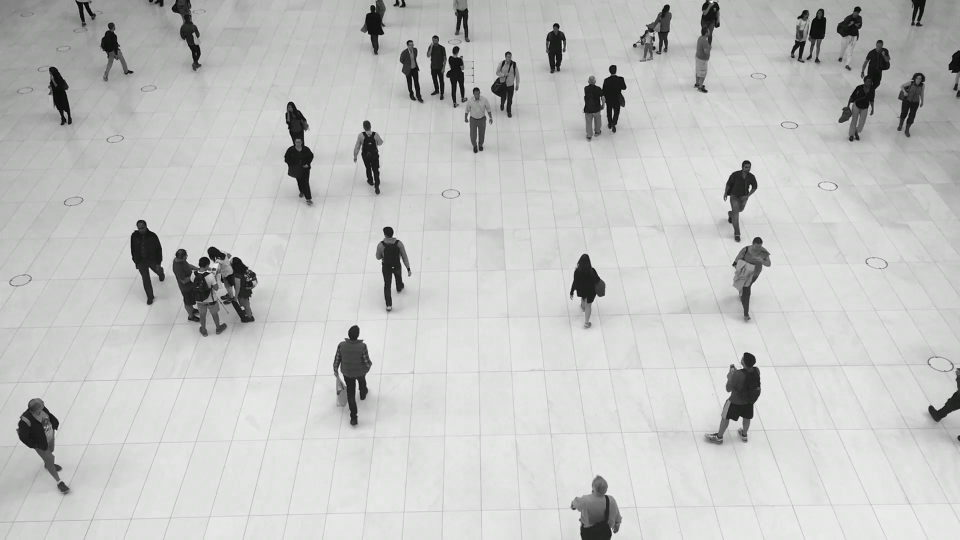

In [363]:
forcc = cv2.VideoWriter_fourcc(*'MP4V')

video = cv2.VideoCapture(path_video)
ok, frame = video.read()
frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)
cv2_imshow(frame)

videos_paths = [f"{nameSubtra}.mp4" for nameSubtra in BGS_types]
subs = [getBGSubtractor(bgs_type) for bgs_type in BGS_types]

out = cv2.VideoWriter('Original.mp4', forcc, 20.0, (frame.shape[1], frame.shape[0]), isColor=True)
outs = [cv2.VideoWriter(path, forcc, 20.0, (frame.shape[1], frame.shape[0]), isColor=False) for path in videos_paths]

In [364]:
videos_paths, subs

(['GMG.mp4', 'MOG.mp4', 'MOG2.mp4', 'KNN.mp4', 'CNT.mp4'],
 [< cv2.bgsegm.BackgroundSubtractorGMG 0x7cedbd893010>,
  < cv2.bgsegm.BackgroundSubtractorMOG 0x7cedbd7fe590>,
  < cv2.BackgroundSubtractorMOG2 0x7cedbd7fe530>,
  < cv2.BackgroundSubtractorKNN 0x7cedbd7fe510>,
  < cv2.bgsegm.BackgroundSubtractorCNT 0x7cedbd7fe5b0>])

In [365]:
duracao_do_video_segundos = 10 #@param
frames_to_show = int(video.get(cv2.CAP_PROP_FPS)) * duracao_do_video_segundos

In [366]:
video = cv2.VideoCapture(path_video)
min_area = 250

if not video.isOpened():
  raise Exception("Error opening video file")

frame_count = 0
while video.isOpened() and frame_count < frames_to_show:
  ret, frame = video.read()
  if not ret:
    break

  frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)

  for name, sub, out_t in zip(BGS_types, subs, outs):
    mask = sub.apply(frame)
    mask = getFilter(mask, "erosion")
    mask = cv2.putText(mask, f"Subtract: {name}", (10, 30), FONT, 1, TEXT_COLOR, 2, cv2.LINE_AA)
    out_t.write(mask)

  out.write(frame)
  frame_count += 1

for out_t in outs:
  out_t.release()
out.release()
video.release()

> ❗UTILIZE O COLAB PARA VISUALIZAR OS RESULTADOS

In [367]:
show_videos_side_by_side(*videos_paths, 'Original.mp4', tempo_max=duracao_do_video_segundos);

# Detectando o movimento e distancia

In [385]:
BGS_usings = ["KNN", "CNT"]

In [386]:
video = cv2.VideoCapture(path_video)
ok, frame = video.read()
frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)
height, width, _ = frame.shape

videos_paths_movimentos = [f"Result_{nameSubtra}.mp4" for nameSubtra in BGS_usings]
subs_movimentos = [getBGSubtractor(bgs_type) for bgs_type in BGS_usings]
outs_movimentos = [cv2.VideoWriter(path, forcc, 20.0, (width, height), isColor=True) for path in videos_paths_movimentos]

out_movimentos = cv2.VideoWriter('Original_movimento.mp4', forcc, 20.0, (width, height), isColor=True)
out_distanciamento = cv2.VideoWriter('Original_distanciamento.mp4', forcc, 20.0, (width, height), isColor=True)

# colors = [(randint(0, 255), randint(0, 255), randint(0, 255)) for _ in range(len(BGS_usings))]
colors = [(96, 223, 239), (246, 227, 104)]

In [387]:
duracao_do_video_segundos = 20
frames_to_show = int(video.get(cv2.CAP_PROP_FPS)) * duracao_do_video_segundos
frames_to_show

500

In [388]:
video = cv2.VideoCapture(path_video)
min_area = 250
min_area_2 = 400
max_area = 4000

if not video.isOpened():
  raise Exception("Error opening video file")

frame_count = 0
while video.isOpened() and frame_count < frames_to_show:
  ret, frame = video.read()
  if not ret:
    break

  frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)
  frames_mod = [frame.copy() for _ in range(len(BGS_usings))]
  frames_trat = [frame.copy() for _ in range(2)]

  for name, sub, out_t, color, frame_mod in zip(BGS_usings, subs_movimentos, outs_movimentos, colors, frames_mod):
    mask = sub.apply(frame_mod)
    mask = getFilter(mask, "erosion")
    mask = cv2.medianBlur(mask, 5)
    (contours, _) = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for contour in contours:
      area = cv2.contourArea(contour)
      (x, y, w, h) = cv2.boundingRect(contour)

      if area >= min_area:
        cv2.drawContours(frame_mod, [contour], -1, color, 2)
        cv2.drawContours(frames_trat[0], [contour], -1, color, 2)
        cv2.rectangle(frames_trat[0], (x, y), (x + w, y + h), color, 2)

      if area >= max_area:
        cv2.putText(frames_trat[1], "Alerta de Distancia!", (x, y - 10), FONT, 0.5, (0, 0, 255), 1)
        cv2.drawContours(frames_trat[1], [contour], -1, color, 2)
        cv2.rectangle(frames_trat[1], (x, y), (x + w, y + h), color, 2)


    _, mask = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    result = cv2.bitwise_and(frame_mod , frame_mod, mask=mask)
    result = cv2.putText(result, f"Subtract: {name}", (10, 30), FONT, 1, color, 2, cv2.LINE_AA)
    out_t.write(result)

  cv2.putText(frames_trat[0], f"Movimentos", (10, 30), FONT, 1, (255, 255, 255), 2, cv2.LINE_AA)
  cv2.putText(frames_trat[1], f"Alerta Distanciamento", (10, 30), FONT, 1, (255, 255, 255), 2, cv2.LINE_AA)
  out_movimentos.write(frames_trat[0])
  out_distanciamento.write(frames_trat[1])
  frame_count += 1

[out_t.release() for out_t in outs_movimentos]
out_movimentos.release()
out_distanciamento.release()
video.release()

# Resultados

> ❗UTILIZE O COLAB PARA VISUALIZAR OS RESULTADOS

In [389]:
show_videos_side_by_side(*videos_paths_movimentos, 'Original_movimento.mp4', 'Original_distanciamento.mp4', tempo_max=duracao_do_video_segundos,items_per_row=4);